# 1. Pip install

In [ ]:
!pip install gymnasium[mujoco] mujoco pyvirtualdisplay

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.0/42.0 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.8/6.8 MB 75.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 243.5/243.5 kB 23.7 MB/s eta 0:00:00


In [ ]:
!apt-get install -y xvfb python-opengl > /dev/null 2>&1
!apt-get install xvfb
!pip install gym pyvirtualdisplay > /dev/null 2>&1
!pip install JSAnimation
!pip install xvfbwrapper
!pip install gym-notebook-wrapper
!pip install numpy
!pip install cpprb

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
xvfb is already the newest version (2:21.1.4-2ubuntu1.7~22.04.15).
0 upgraded, 0 newly installed, 0 to remove and 38 not upgraded.
  Preparing metadata (setup.py) ... done
  Created wheel for JSAnimation: filename=JSAnimation-0.1-py3-none-any.whl size=11407 sha256=7d65a9246d2b2f3c3465e8c71e993b4693dbaaeba86e7b3d7f053f8f5e69078a
  Stored in directory: /root/.cache/pip/wheels/2d/6e/2e/c0e2a000cd36fbb86a92b6e7f0042a195ca3a080898a928f9f
Successfully built JSAnimation
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 24.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 35.8 MB/s eta 0:00:00


# 2. Import library

In [ ]:
import copy, time, pickle, math
import numpy as np
import argparse, os, traceback, glob
import json
from collections import deque
from time import time
from datetime import timedelta, datetime
from abc import ABC, abstractmethod
from base64 import b64encode

import gymnasium as gym
import gnwrapper
from gymnasium.wrappers import NormalizeObservation

from scipy.signal import lfilter
from cpprb import ReplayBuffer

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.distributions import Categorical, Normal, MultivariateNormal

import matplotlib
import matplotlib.animation as animation
import matplotlib.pyplot as plt
import seaborn as sns

from IPython import display
from IPython.display import HTML
import warnings
warnings.filterwarnings('ignore')

# Set style for better plots
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

Gym has been unmaintained since 2022 and does not support NumPy 2.0 amongst other critical functionality.
Please upgrade to Gymnasium, the maintained drop-in replacement of Gym, or contact the authors of your software and request that they upgrade.
See the migration guide at https://gymnasium.farama.org/introduction/migration_guide/ for additional information.
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [ ]:
# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


# 3. Virtual display

In [ ]:
from pyvirtualdisplay import Display
pydisplay = Display(visible=0, size=(400, 300))
pydisplay.start()

# 4. Run Test

In [ ]:
env = gym.make('Humanoid-v5', ctrl_cost_weight=0.1, render_mode='rgb_array')

In [ ]:
frames = []
for episode in range(5):
    state = env.reset()
    screen = env.render()
    frames.append(screen)
    done = False
    while not done:
        action = env.action_space.sample()
        next_state, reward, terminated, truncated, _ = env.step(action)
        done = terminated or truncated
        screen = env.render()
        frames.append(screen)
env.close()

In [ ]:
# 結果の確認
plt.figure(figsize=(frames[0].shape[1]/72.0, frames[0].shape[0]/72.0), dpi=72)
patch = plt.imshow(frames[0])
plt.axis('off')

def animate(i):
    patch.set_data(frames[i])

anim = animation.FuncAnimation(plt.gcf(), animate, frames=len(frames), interval=50)
plt.close()
HTML(anim.to_jshtml())

### Wrap_monior

In [ ]:
# def wrap_monitor(env):
#     """ Gymの環境をmp4に保存するために，環境をラップする関数． """
#     return gym.wrappers.RecordVideo(env, '/tmp/monitor', episode_trigger=lambda x: True)

# def play_mp4():
#     """ 保存したmp4をHTMLに埋め込み再生する関数． """
#     path = glob.glob(os.path.join('/tmp/monitor', '*.mp4'))[0]
#     mp4 = open(path, 'rb').read()
#     url = "data:video/mp4;base64," + b64encode(mp4).decode()
#     return HTML("""<video width=400 controls><source src="%s" type="video/mp4"></video>""" % url)

# env = wrap_monitor(gym.make('Humanoid-v5', ctrl_cost_weight=0.1, render_mode='rgb_array'))

# print('observation space: ', env.observation_space)
# print('action space: ', env.action_space)

# state, _ = env.reset()
# done = False
# steps = 0
# max_steps = 200 # Run for a fixed number of steps to ensure video recording

# # Run for a fixed number of steps or until done
# while (not done and steps < max_steps):
#   action = env.action_space.sample()
#   next_state, reward, terminated, truncated, info = env.step(np.zeros_like(action))
#   done = terminated or truncated
#   steps += 1

# env.close() # Explicitly close the environment to ensure video is saved

# del env

# play_mp4()

# 5. Helper Functions and Utilities

### On-policy buffer

In [ ]:
class RolloutBuffer:
    def __init__(self, buffer_size, state_shape, action_shape, device=torch.device('cuda')):
        self.states = torch.empty((buffer_size, *state_shape), dtype=torch.float, device=device)
        self.actions = torch.empty((buffer_size, *action_shape), dtype=torch.float, device=device)
        self.rewards = torch.empty((buffer_size, 1), dtype=torch.float, device=device)
        self.dones = torch.empty((buffer_size, 1), dtype=torch.float, device=device)
        self.log_pis = torch.empty((buffer_size, 1), dtype=torch.float, device=device)
        self.next_states = torch.empty((buffer_size, *state_shape), dtype=torch.float, device=device)
        self._p = 0
        self.buffer_size = buffer_size

    def append(self, state, action, reward, done, log_pi, next_state):
        self.states[self._p].copy_(torch.from_numpy(state))
        self.actions[self._p].copy_(torch.from_numpy(action))
        self.rewards[self._p] = float(reward)
        self.dones[self._p] = float(done)
        self.log_pis[self._p] = float(log_pi)
        self.next_states[self._p].copy_(torch.from_numpy(next_state))
        self._p = (self._p + 1) % self.buffer_size

    def get(self):
        assert self._p == 0, 'Buffer needs to be full before training.'
        return self.states, self.actions, self.rewards, self.dones, self.log_pis, self.next_states

### Heplper functions for PPO

In [ ]:
class RunningMeanStd:
    def __init__(self, shape=(), epsilon=1e-8):
        self.mean = np.zeros(shape, 'float64')
        self.var = np.ones(shape, 'float64')
        self.count = epsilon

    def update(self, x):
        batch_mean = np.mean(x, axis=0)
        batch_var = np.var(x, axis=0)
        batch_count = x.shape[0]
        delta = batch_mean - self.mean
        tot_count = self.count + batch_count
        new_mean = self.mean + delta * batch_count / tot_count
        m_a = self.var * self.count
        m_b = batch_var * batch_count
        m_2 = m_a + m_b + np.square(delta) * self.count * batch_count / tot_count
        new_var = m_2 / tot_count
        self.mean = new_mean
        self.var = new_var
        self.count = tot_count

In [ ]:
def calculate_log_pi(log_stds, noises, actions):
    """ Returns the probability density of a probabilistic action. """
    gaussian_log_probs = \
        (-0.5 * noises.pow(2) - log_stds).sum(dim=-1, keepdim=True) - 0.5 * math.log(2 * math.pi) * log_stds.size(-1)

    log_pis = gaussian_log_probs - torch.log(1 - actions.pow(2) + 1e-6).sum(dim=-1, keepdim=True)

    return log_pis

def reparameterize(means, log_stds):
    """ Returns probabilistic actions and their probability densities using the Reparameterization Trick. """
    stds = log_stds.exp()
    noises = torch.randn_like(means)
    us = means + noises * stds
    actions = torch.tanh(us)
    log_pis = calculate_log_pi(log_stds, noises, actions)

    return actions, log_pis

def atanh(x):
    """ Inverse function of tanh. """
    return 0.5 * (torch.log(1 + x + 1e-6) - torch.log(1 - x + 1e-6))

def evaluate_lop_pi(means, log_stds, actions):
    """ Calculate the logarithm of the probability density of actions in a policy parameterized by mean and log standard deviation. """
    noises = (atanh(actions) - means) / (log_stds.exp() + 1e-8)
    return calculate_log_pi(log_stds, noises, actions)

def fix_seed(seed):
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)

def discount_cumsum(x, discount):
    """Compute discounted cumulative sum"""
    return lfilter([1], [1, -discount], x[::-1], axis=0)[::-1]

In [ ]:
def calculate_advantage(values, rewards, dones, next_values, gamma=0.995, lambd=0.997):
    deltas = rewards + gamma * next_values * (1 - dones) - values
    advantages = torch.empty_like(rewards)
    advantages[-1] = deltas[-1]
    for t in reversed(range(rewards.size(0) - 1)):
        advantages[t] = deltas[t] + gamma * lambd * (1 - dones[t]) * advantages[t + 1]
    targets = advantages + values
    advantages = (advantages - advantages.mean()) / (advantages.std() + 1e-8)
    return targets, advantages

### Helper Function for TRPO

In [ ]:
def conjugate_gradient(A, b, max_iter=10, residual_tol=1e-10):
    """
    Conjugate gradient algorithm for solving Ax = b
    A: Function that computes matrix-vector product
    b: Target vector
    """
    x = torch.zeros_like(b)
    r = b.clone()
    p = r.clone()
    rs_old = torch.dot(r, r)

    for i in range(max_iter):
        Ap = A(p)
        alpha = rs_old / (torch.dot(p, Ap) + 1e-10)
        x = x + alpha * p
        r = r - alpha * Ap
        rs_new = torch.dot(r, r)

        if torch.sqrt(rs_new) < residual_tol:
            break

        p = r + (rs_new / rs_old) * p
        rs_old = rs_new

    return x

In [ ]:
def flat_grad(grads, params):
    """Flatten gradients"""
    grad_flatten = []
    for grad in grads:
        if grad is None:
            continue
        grad_flatten.append(grad.view(-1))
    return torch.cat(grad_flatten)

def flat_params(model):
    """Flatten model parameters"""
    return torch.cat([param.view(-1) for param in model.parameters()])

def update_model(model, new_params):
    """Update model with new flattened parameters"""
    idx = 0
    for param in model.parameters():
        param_length = param.numel()
        param.data = new_params[idx:idx + param_length].view(param.shape)
        idx += param_length

def compute_kl(actor, states, actions_old, log_pis_old):
    """Compute KL divergence between old and new policy"""
    log_pis_new = actor.evaluate_log_pi(states, actions_old)
    kl = (log_pis_old - log_pis_new).mean()
    return kl

# 6. Neural Networks

### PPO Network

In [ ]:
class PPOCritic(nn.Module):
    def __init__(self, state_dim, hidden_dim=256):
        super(PPOCritic, self).__init__()

        self.net = nn.Sequential(
            nn.Linear(state_dim[0], hidden_dim),
            nn.Tanh(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.Tanh(),
            nn.Linear(hidden_dim, 1),
        )

    def forward(self, state):
        return self.net(state)

In [ ]:
class GaussianActor(nn.Module):
    """Gaussian actor for PPO"""
    def __init__(self, state_dim, action_dim, hidden_dim=256, max_action=1.0):
        super(GaussianActor, self).__init__()
        self.net = nn.Sequential(
            nn.Linear(state_dim[0], hidden_dim),
            nn.Tanh(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.Tanh(),
            nn.Linear(hidden_dim, action_dim[0]),
        )
        self.log_stds= nn.Parameter(torch.zeros(1, action_dim[0]))
        self.max_action = max_action

    def forward(self, states):
        return self.max_action * torch.tanh(self.net(states))

    def sample(self, states):
        return reparameterize(self.net(states), self.log_stds)

    def evaluate_log_pi(self, states, actions):
        return evaluate_lop_pi(self.net(states), self.log_stds, actions)

# 7. Reinforcement Learning Algorithm

### Algo

In [ ]:
class Algorithm(ABC):
    @abstractmethod
    def explore(self, state):
        pass
    @abstractmethod
    def exploit(self, state):
        pass
    @abstractmethod
    def is_update(self, steps):
        pass
    @abstractmethod
    def step(self, env, state, t, steps):
        pass
    @abstractmethod
    def update(self):
        pass

### 7.1 PPO Implementation

In [ ]:
class PPO(Algorithm):
    def __init__(self, state_dim, action_dim, hidden_dim=256,max_action=1.0, seed=0, batch_size=64,
                 lr=3e-4, gamma=0.995, lr_actor=3e-4, lr_critic=3e-4, rollout_length=2048, num_updates=10,
                 clip_eps=0.2, lambd=0.97, discount=0.9, coef_ent=0.0, max_grad_norm=0.5, device=torch.device('cuda')):
        super(PPO, self).__init__()

        fix_seed(seed)

        self.buffer = RolloutBuffer(
            buffer_size=rollout_length,
            state_shape=state_dim,
            action_shape=action_dim,
            device=device
        )

        self.actor = GaussianActor(state_dim, action_dim, hidden_dim, max_action).to(device)
        self.optim_actor = torch.optim.Adam(self.actor.parameters(), lr=lr_actor)

        self.critic = PPOCritic(state_dim, hidden_dim).to(device)
        self.optim_critic = torch.optim.Adam(self.critic.parameters(), lr=lr_critic)

        self.learning_steps = 0
        self.device = device
        self.batch_size = batch_size
        self.max_action = max_action
        self.discount = discount
        self.gamma = gamma
        self.rollout_length = rollout_length
        self.num_updates = num_updates
        self.lambd = lambd
        self.clip_eps = clip_eps
        self.coef_ent = coef_ent
        self.max_grad_norm = max_grad_norm

    def explore(self, state):
        state = torch.tensor(state, dtype=torch.float, device=self.device).unsqueeze_(0)
        with torch.no_grad():
            action, log_pi = self.actor.sample(state)
        return action.cpu().numpy()[0] * self.max_action, log_pi.item()

    def exploit(self, state):
        state = torch.tensor(state, dtype=torch.float, device=self.device).unsqueeze_(0)
        with torch.no_grad():
            action = self.actor(state)
        return action.cpu().numpy()[0]

    def is_update(self, steps):
        # Learn when one rollout of data is accumulated.
        return steps % self.rollout_length == 0

    def step(self, env, state, t, steps):
        t += 1
        action, log_pi = self.explore(state)
        next_state, reward, terminated, truncated, info = env.step(action)
        done = terminated or truncated

        done_masked = done if not truncated else False

        self.buffer.append(state, action, reward, done_masked, log_pi, next_state)

        if done:
            t = 0
            next_state, _ = env.reset()

        return next_state, t

    def update(self):
        self.learning_steps += 1

        states, actions, rewards, dones, log_pis, next_states = self.buffer.get()

        with torch.no_grad():
            values = self.critic(states)
            next_values = self.critic(next_states)
        targets, advantages = calculate_advantage(values, rewards, dones, next_values, self.gamma, self.lambd)

        for _ in range(self.num_updates):
            indices = np.arange(self.rollout_length)
            np.random.shuffle(indices)

            for start in range(0, self.rollout_length, self.batch_size):
                idxes = indices[start:start+self.batch_size]
                self.update_critic(states[idxes], targets[idxes])
                self.update_actor(states[idxes], actions[idxes], log_pis[idxes], advantages[idxes])

    def update_critic(self, states, targets):
        loss_critic = (self.critic(states) - targets).pow_(2).mean()

        self.optim_critic.zero_grad()
        loss_critic.backward(retain_graph=False)
        nn.utils.clip_grad_norm_(self.critic.parameters(), self.max_grad_norm)
        self.optim_critic.step()

    def update_actor(self, states, actions, log_pis_old, advantages):
        log_pis = self.actor.evaluate_log_pi(states, actions)
        mean_entropy = -log_pis.mean()

        ratios = (log_pis - log_pis_old).exp_()
        loss_actor1 = -ratios * advantages
        loss_actor2 = -torch.clamp(
            ratios,
            1.0 - self.clip_eps,
            1.0 + self.clip_eps
        ) * advantages
        loss_actor = torch.max(loss_actor1, loss_actor2).mean() - self.coef_ent * mean_entropy

        self.optim_actor.zero_grad()
        loss_actor.backward(retain_graph=False)
        nn.utils.clip_grad_norm_(self.actor.parameters(), self.max_grad_norm)
        self.optim_actor.step()

### 7.2 TRPO Implementation

In [ ]:
class TRPO(Algorithm):
    def __init__(self, state_dim, action_dim, hidden_dim=256, max_action=1.0, seed=0,
                 lr_critic=3e-4, gamma=0.995, rollout_length=2048, num_updates=1,
                 lambd=0.97, max_kl=0.01, damping=0.1, max_grad_norm=0.5,
                 cg_iters=10, backtrack_iters=10, backtrack_coeff=0.8,
                 device=torch.device('cuda')):
        super(TRPO, self).__init__()

        fix_seed(seed)

        self.buffer = RolloutBuffer(
            buffer_size=rollout_length,
            state_shape=state_dim,
            action_shape=action_dim,
            device=device
        )

        self.actor = GaussianActor(state_dim, action_dim, hidden_dim, max_action).to(device)

        self.critic = PPOCritic(state_dim, hidden_dim).to(device)
        self.optim_critic = torch.optim.Adam(self.critic.parameters(), lr=lr_critic)

        self.learning_steps = 0
        self.device = device
        self.max_action = max_action
        self.gamma = gamma
        self.rollout_length = rollout_length
        self.num_updates = num_updates
        self.lambd = lambd
        self.max_kl = max_kl
        self.damping = damping
        self.max_grad_norm = max_grad_norm
        self.cg_iters = cg_iters
        self.backtrack_iters = backtrack_iters
        self.backtrack_coeff = backtrack_coeff

    def explore(self, state):
        state = torch.tensor(state, dtype=torch.float, device=self.device).unsqueeze_(0)
        with torch.no_grad():
            action, log_pi = self.actor.sample(state)
        return action.cpu().numpy()[0] * self.max_action, log_pi.item()

    def exploit(self, state):
        state = torch.tensor(state, dtype=torch.float, device=self.device).unsqueeze_(0)
        with torch.no_grad():
            action = self.actor(state)
        return action.cpu().numpy()[0]

    def is_update(self, steps):
        return steps % self.rollout_length == 0

    def step(self, env, state, t, steps):
        t += 1
        action, log_pi = self.explore(state)
        next_state, reward, terminated, truncated, info = env.step(action)
        done = terminated or truncated

        done_masked = done if not truncated else False

        self.buffer.append(state, action, reward, done_masked, log_pi, next_state)

        if done:
            t = 0
            next_state, _ = env.reset()

        return next_state, t

    def update(self):
        self.learning_steps += 1

        states, actions, rewards, dones, log_pis_old, next_states = self.buffer.get()

        with torch.no_grad():
            values = self.critic(states)
            next_values = self.critic(next_states)
        targets, advantages = calculate_advantage(values, rewards, dones, next_values, self.gamma, self.lambd)

        # Update critic multiple times
        for _ in range(self.num_updates):
            self.update_critic(states, targets)

        # Update actor once with TRPO
        self.update_actor(states, actions, log_pis_old, advantages)

    def update_critic(self, states, targets):
        loss_critic = (self.critic(states) - targets).pow_(2).mean()

        self.optim_critic.zero_grad()
        loss_critic.backward(retain_graph=False)
        nn.utils.clip_grad_norm_(self.critic.parameters(), self.max_grad_norm)
        self.optim_critic.step()

    def update_actor(self, states, actions, log_pis_old, advantages):
        """TRPO actor update using conjugate gradient and line search"""

        # Compute policy gradient
        log_pis = self.actor.evaluate_log_pi(states, actions)
        ratios = (log_pis - log_pis_old).exp()
        loss_actor = -(ratios * advantages).mean()

        # Compute gradient
        grads = torch.autograd.grad(loss_actor, self.actor.parameters(), retain_graph=True)
        loss_grad = flat_grad(grads, self.actor.parameters())

        # Compute Fisher-vector product function
        def Fvp(v):
            kl = compute_kl(self.actor, states, actions, log_pis_old)
            grads = torch.autograd.grad(kl, self.actor.parameters(), create_graph=True)
            flat_grad_kl = flat_grad(grads, self.actor.parameters())

            kl_v = (flat_grad_kl * v).sum()
            grads = torch.autograd.grad(kl_v, self.actor.parameters())
            flat_grad_grad_kl = flat_grad(grads, self.actor.parameters())

            return flat_grad_grad_kl + v * self.damping

        # Solve Fx = g using conjugate gradient
        stepdir = conjugate_gradient(Fvp, -loss_grad, max_iter=self.cg_iters)

        # Compute step size
        shs = 0.5 * torch.dot(stepdir, Fvp(stepdir))
        lm = torch.sqrt(shs / self.max_kl)
        fullstep = stepdir / lm

        # Line search with backtracking
        old_params = flat_params(self.actor)
        old_loss = loss_actor.item()

        for i in range(self.backtrack_iters):
            new_params = old_params + (self.backtrack_coeff ** i) * fullstep
            update_model(self.actor, new_params)

            with torch.no_grad():
                log_pis_new = self.actor.evaluate_log_pi(states, actions)
                ratios_new = (log_pis_new - log_pis_old).exp()
                loss_new = -(ratios_new * advantages).mean()
                kl_new = compute_kl(self.actor, states, actions, log_pis_old)

            # Check improvement and KL constraint
            if loss_new < old_loss and kl_new < self.max_kl:
                break

            # If no improvement, restore old parameters
            if i == self.backtrack_iters - 1:
                update_model(self.actor, old_params)

# 8. Training Functions

In [ ]:
class Trainer:
    def __init__(self, env, env_test, algo, text, seed=0, num_steps=10**6, eval_interval=10**4, num_eval_episodes=3):
        self.env = env
        self.env_test = env_test
        self.algo = algo
        self.seed = seed
        self.returns = {'step': [], 'return': []}
        self.num_steps = num_steps
        self.eval_interval = eval_interval
        self.num_eval_episodes = num_eval_episodes
        self.text = text

    def train(self):
        """ Repeat data collection, learning, and evaluation for num_steps. """
        self.start_time = time()
        t = 0
        state, _ = self.env.reset(seed=self.seed)

        for steps in range(1, self.num_steps + 1):
            state, t = self.algo.step(self.env, state, t, steps)

            if self.algo.is_update(steps):
                self.algo.update()

            if steps % self.eval_interval == 0:
                self.evaluate(steps)

    def evaluate(self, steps):
        """ Run the environment for multiple episodes and record average returns. """

        returns = []
        for i in range(self.num_eval_episodes):
            state, _ = self.env_test.reset(seed=self.seed + i) # Use different seed for each evaluation episode
            done = False
            episode_return = 0.0

            while (not done):
                action = self.algo.exploit(state)
                state, reward, terminated, truncated, info = self.env_test.step(action)
                done = terminated or truncated
                episode_return += reward

            returns.append(episode_return)

        mean_return = np.mean(returns)
        self.returns['step'].append(steps)
        self.returns['return'].append(mean_return)

        print(f'Num steps: {steps:<6}   '
              f'Return: {mean_return:<5.1f}   '
              f'Time: {self.time}')

    def visualize(self):
        """ Run the environment for 5 episodes and play the mp4. """
        all_frames = []
        for episode in range(2):
            # Explicitly set render_mode='rgb_array' for visualization
            env = gym.make(self.env.unwrapped.spec.id, render_mode='rgb_array')
            state, _ = env.reset(seed=self.seed + episode) # Set seed for visualization
            done = False
            step = 0
            max_steps = 200

            frames = []
            while (not done and step < max_steps):
                action = self.algo.exploit(state)
                state, reward, terminated, truncated, info = env.step(action)
                done = terminated or truncated
                screen = env.render()
                frames.append(screen)
                step += 1

            env.close() # Explicitly close the environment to ensure video is saved
            del env
            all_frames.extend(frames) # Append frames from this episode

        # Create and display the animation from all frames
        plt.figure(figsize=(all_frames[0].shape[1]/72.0, all_frames[0].shape[0]/72.0), dpi=72)
        patch = plt.imshow(all_frames[0])
        plt.axis('off')

        def animate(i):
            patch.set_data(all_frames[i])

        anim = animation.FuncAnimation(plt.gcf(), animate, frames=len(all_frames), interval=50)
        plt.close()

        # Save the animation as an mp4 file
        anim.save(f'{self.text}.mp4', writer='ffmpeg')

        return HTML(anim.to_jshtml())


    def plot(self):
        """ Plot the graph of average returns. """
        fig = plt.figure(figsize=(8, 6))
        plt.plot(self.returns['step'], self.returns['return'])
        plt.xlabel('Steps', fontsize=24)
        plt.ylabel('Return', fontsize=24)
        plt.tick_params(labelsize=18)
        plt.title(f'{self.text}-{self.env.unwrapped.spec.id}', fontsize=24)
        plt.tight_layout()

    @property
    def time(self):
        """ Elapsed time since training started. """
        return str(timedelta(seconds=int(time() - self.start_time)))

### 8.1 Training PPO

In [ ]:
ENV_ID = 'Humanoid-v5'
SEED = 0
NUM_STEPS = 1 * 10 ** 6
EVAL_INTERVAL = 5 * 10 ** 3

env_ppo = gym.make(ENV_ID)
env_test_ppo = gym.make(ENV_ID)

algo_ppo = PPO(
    state_dim=env_ppo.observation_space.shape,
    action_dim=env_ppo.action_space.shape,
    seed=SEED
)

trainer_ppo = Trainer(
    env=env_ppo,
    env_test=env_test_ppo,
    algo=algo_ppo,
    seed=SEED,
    num_steps=NUM_STEPS,
    eval_interval=EVAL_INTERVAL,
    text='On-Policy-PPO-algorithm'
)

In [ ]:
trainer_ppo.train()

Num steps: 5000     Return: 92.4    Time: 0:00:11
Num steps: 10000    Return: 250.5   Time: 0:00:22
Num steps: 15000    Return: 298.0   Time: 0:00:34
Num steps: 20000    Return: 279.9   Time: 0:00:45
Num steps: 25000    Return: 328.1   Time: 0:00:58
Num steps: 30000    Return: 308.3   Time: 0:01:09
Num steps: 35000    Return: 308.8   Time: 0:01:22
Num steps: 40000    Return: 396.7   Time: 0:01:33
Num steps: 45000    Return: 310.0   Time: 0:01:44
Num steps: 50000    Return: 370.9   Time: 0:01:57
Num steps: 55000    Return: 323.0   Time: 0:02:08
Num steps: 60000    Return: 313.2   Time: 0:02:21
Num steps: 65000    Return: 354.3   Time: 0:02:32
Num steps: 70000    Return: 300.0   Time: 0:02:44
Num steps: 75000    Return: 460.8   Time: 0:02:55
Num steps: 80000    Return: 298.4   Time: 0:03:08
Num steps: 85000    Return: 190.0   Time: 0:03:19
Num steps: 90000    Return: 341.5   Time: 0:03:30
Num steps: 95000    Return: 322.9   Time: 0:03:42
Num steps: 100000   Return: 365.1   Time: 0:03:53


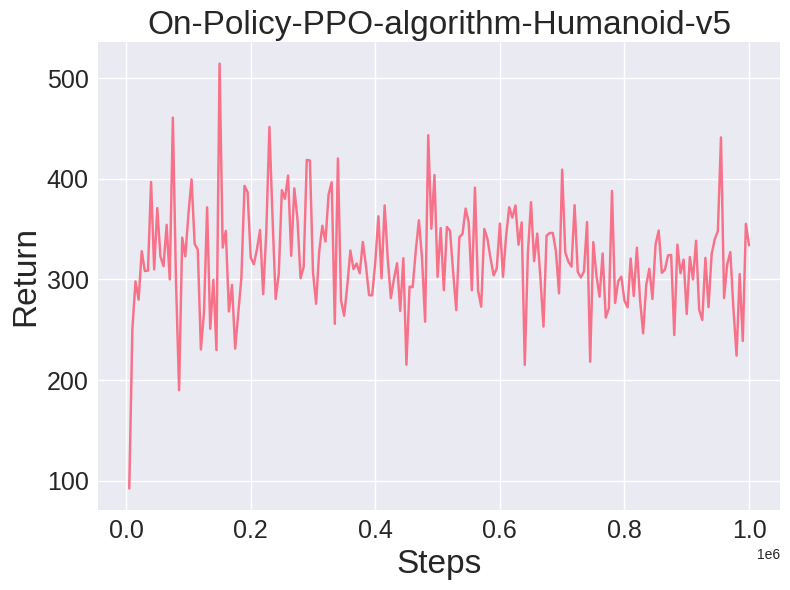

In [ ]:
trainer_ppo.plot()

In [ ]:
trainer_ppo.visualize()

In [ ]:
del env_ppo
del env_test_ppo
del algo_ppo
del trainer_ppo

### 8.2 Training TRPO

In [ ]:
ENV_ID = 'Humanoid-v5'
SEED = 0
NUM_STEPS = 1 * 10 ** 6
EVAL_INTERVAL = 5 * 10 ** 3

env_trpo = gym.make(ENV_ID)
env_test_trpo = gym.make(ENV_ID)

algo_trpo = TRPO(
    state_dim=env_trpo.observation_space.shape,
    action_dim=env_trpo.action_space.shape,
    seed=SEED,
    rollout_length=2048,
    max_kl=0.01,
    cg_iters=10,
    backtrack_iters=10
)

trainer_trpo = Trainer(
    env=env_trpo,
    env_test=env_test_trpo,
    algo=algo_trpo,
    seed=SEED,
    num_steps=NUM_STEPS,
    eval_interval=EVAL_INTERVAL,
    text='On-Policy-TRPO-algorithm'
)

In [ ]:
trainer_trpo.train()

Num steps: 5000     Return: 203.3   Time: 0:00:07
Num steps: 10000    Return: 226.2   Time: 0:00:15
Num steps: 15000    Return: 256.1   Time: 0:00:23
Num steps: 20000    Return: 244.3   Time: 0:00:31
Num steps: 25000    Return: 234.8   Time: 0:00:39
Num steps: 30000    Return: 263.0   Time: 0:00:46
Num steps: 35000    Return: 248.9   Time: 0:00:54
Num steps: 40000    Return: 205.0   Time: 0:01:02
Num steps: 45000    Return: 198.1   Time: 0:01:10
Num steps: 50000    Return: 211.9   Time: 0:01:18
Num steps: 55000    Return: 257.5   Time: 0:01:25
Num steps: 60000    Return: 218.4   Time: 0:01:33
Num steps: 65000    Return: 226.3   Time: 0:01:41
Num steps: 70000    Return: 234.8   Time: 0:01:49
Num steps: 75000    Return: 236.4   Time: 0:01:57
Num steps: 80000    Return: 221.1   Time: 0:02:05
Num steps: 85000    Return: 247.3   Time: 0:02:13
Num steps: 90000    Return: 286.0   Time: 0:02:21
Num steps: 95000    Return: 240.5   Time: 0:02:29
Num steps: 100000   Return: 235.6   Time: 0:02:37


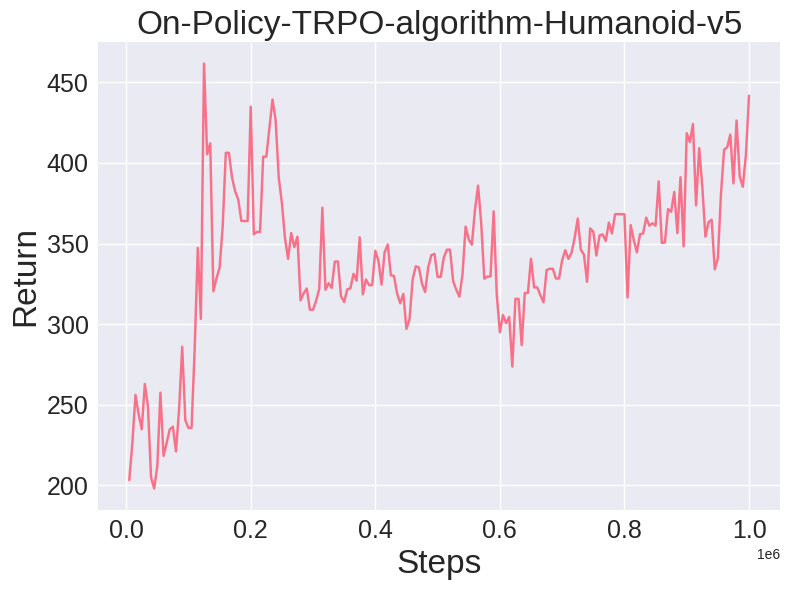

In [ ]:
trainer_trpo.plot()

In [ ]:
trainer_trpo.visualize()

In [ ]:
del env_trpo
del env_test_trpo
del algo_trpo
del trainer_trpo

In [ ]:
from moviepy.editor import VideoFileClip

def mp4_to_gif(mp4_path, gif_path):
    """Converts an MP4 file to a GIF file."""
    try:
        clip = VideoFileClip(mp4_path)
        clip.write_gif(gif_path)
        print(f"Successfully converted {mp4_path} to {gif_path}")
    except Exception as e:
        print(f"Error converting {mp4_path} to GIF: {e}")

In [ ]:
mp4_to_gif('/content/On-Policy-PPO-algorithm.mp4', '/content/On-Policy-PPO-algorithm.gif')
mp4_to_gif('/content/On-Policy-TRPO-algorithm.mp4', '/content/On-Policy-TRPO-algorithm.gif')

MoviePy - Building file /content/On-Policy-PPO-algorithm.gif with imageio.


Successfully converted /content/On-Policy-PPO-algorithm.mp4 to /content/On-Policy-PPO-algorithm.gif
MoviePy - Building file /content/On-Policy-TRPO-algorithm.gif with imageio.


Successfully converted /content/On-Policy-TRPO-algorithm.mp4 to /content/On-Policy-TRPO-algorithm.gif
